In [3]:
# Importation des bibliotheques
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
from sklearn.cluster import KMeans
from kmodes.kmodes import KModes
from sklearn.preprocessing import StandardScaler

In [4]:
# je charge les donnees a partir du fichier csv
data=pd.read_csv("C:/Users/Tsinkou Fogang Lydie/Desktop/STAGE/Clustering/B2B Online Shopping.csv")

In [5]:
# je regroupe les donnees par etat du client 

In [6]:
#sales_by_state =data.groupby("customer_state")["payment_value"].sum()

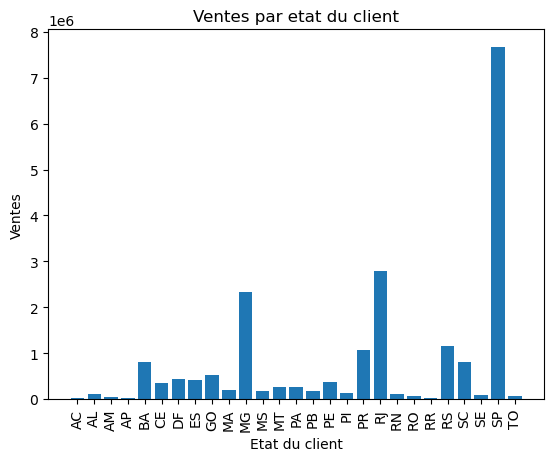

In [7]:
# je regroupe les donnees par etat du client 
sales_by_state =data.groupby("customer_state")["payment_value"].sum()
#je cree un graphique pour visualiser les ventes par etat du client
plt.bar(sales_by_state.index,sales_by_state.values)
plt.xlabel("Etat du client")
plt.ylabel("Ventes")
plt.title("Ventes par etat du client")
plt.xticks(rotation=90)
plt.show()

In [8]:
# Regroupement par état du client et calcul des ventes totales pour chaque état
ventes_par_etat = data.groupby("customer_state")["payment_value"].sum().reset_index()

# Création du graphique à barres interactif avec Plotly
fig = go.Figure(data=[go.Bar(x=ventes_par_etat["customer_state"], y=ventes_par_etat["payment_value"])])

# Personnalisation du graphique
fig.update_layout(
    title="Ventes par état du client",
    xaxis_title="État du client",
    yaxis_title="Ventes"
)

# Affichage du graphique interactif
fig.show()

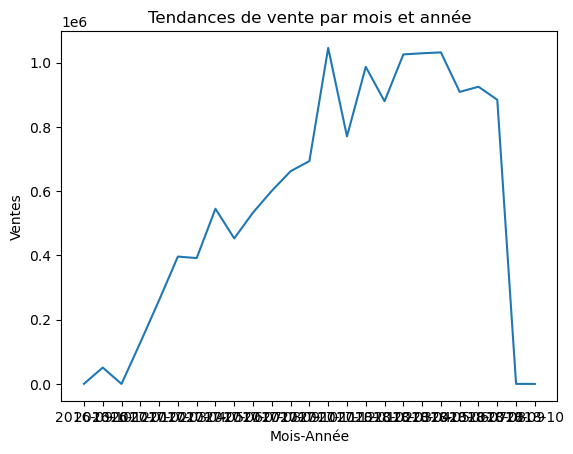

In [9]:

# Convertir la colonne de date en format de date
data['order_date'] = pd.to_datetime(data['order_date'])

# Extraire les mois et les années à partir de la colonne de date
data['month_year'] = data['order_date'].dt.to_period('M')

# Regroupement par mois et année et calcul des ventes totales pour chaque période
ventes_par_mois_annee = data.groupby('month_year')['price'].sum()

# Convertir les objets Period en chaînes de caractères
ventes_par_mois_annee.index = ventes_par_mois_annee.index.astype(str)

# Création du graphique en ligne
plt.plot(ventes_par_mois_annee.index, ventes_par_mois_annee.values)
plt.xlabel("Mois-Année")
plt.ylabel("Ventes")
plt.title("Tendances de vente par mois et année")

# Affichage du graphique
plt.show()

Text(0.5, 1.0, 'ventes par type de paiement')

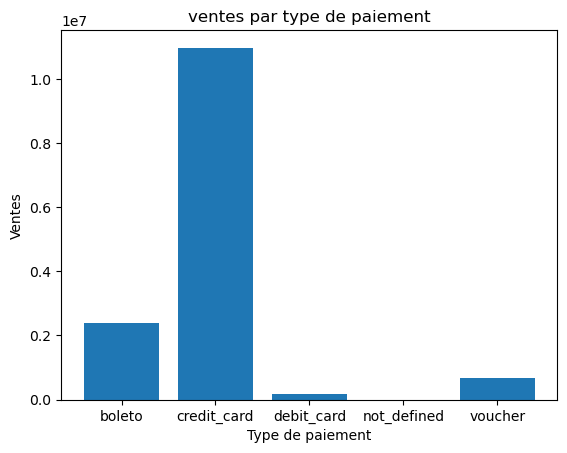

In [10]:
# Analyse entre les differentes ventes et les modes de payment
ventes_par_paiement=data.groupby("payment_type")["price"].sum()

# creation du graphique
plt.bar(ventes_par_paiement.index,ventes_par_paiement.values)
plt.xlabel("Type de paiement")
plt.ylabel("Ventes")
plt.title("ventes par type de paiement")

In [11]:
# Regroupement par type de paiement et calcul des ventes totales pour chaque mode
ventes_par_paiement = data.groupby("payment_type")["price"].sum().reset_index()

# Création du graphique à barres interactif avec Plotly
fig = go.Figure(data=[go.Bar(x=ventes_par_paiement["payment_type"], y=ventes_par_paiement["price"])])

# Personnalisation du graphique
fig.update_layout(
    title="Ventes par type de paiement",
    xaxis_title="Type de paiement",
    yaxis_title="Ventes"
)

# Affichage du graphique interactif
fig.show()

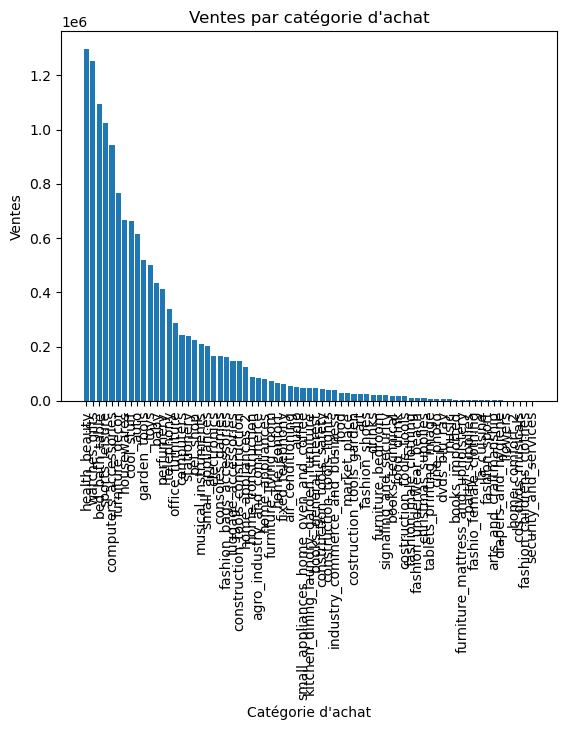

In [12]:
# Regroupement par catégorie d'achat et calcul des ventes totales pour chaque catégorie
ventes_par_categorie = data.groupby("product_category_name_english")["price"].sum()

# Trier les catégories par ordre décroissant de ventes
ventes_par_categorie = ventes_par_categorie.sort_values(ascending=False)

# Création du graphiques
plt.bar(ventes_par_categorie.index, ventes_par_categorie.values)
plt.xlabel("Catégorie d'achat")
plt.ylabel("Ventes")
plt.title("Ventes par catégorie d'achat")

# Rotation des étiquettes de l'axe des x pour une meilleure lisibilité
plt.xticks(rotation=90)

# Affichage du graphique
plt.show()

In [13]:
# Regroupement par catégorie d'achat et calcul des ventes totales pour chaque catégorie
ventes_par_categorie = data.groupby("product_category_name_english")["price"].sum().reset_index()

# Création du graphique interactif avec Plotly Express
fig = px.bar(ventes_par_categorie, x="product_category_name_english", y="price", title="Ventes par catégorie d'achat")

# Affichage du graphique interactif
fig.show()

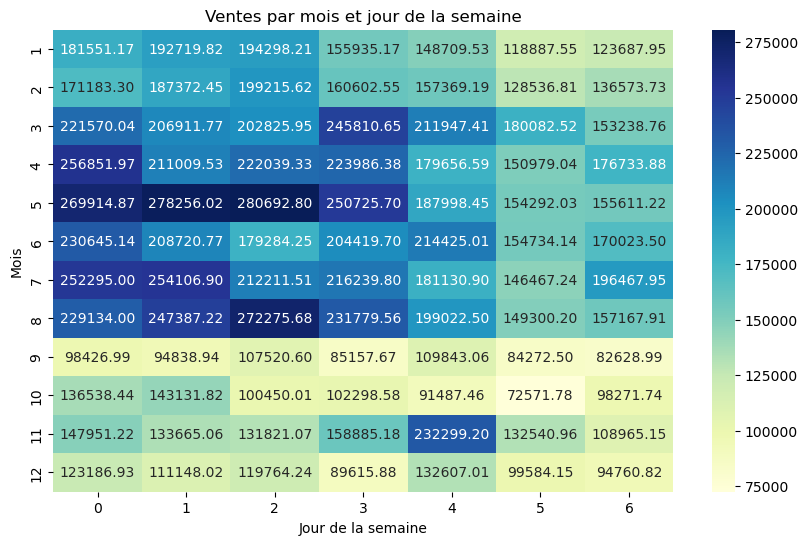

In [14]:
#AUTRE VISUALISATION
# Extraire le mois et le jour de la semaine à partir de la colonne "order_date"
data["order_date"] = pd.to_datetime(data["order_date"])
data["order_month"] = data["order_date"].dt.month
data["order_dayofweek"] = data["order_date"].dt.dayofweek

# Regroupement des ventes par mois et jour de la semaine
ventes_par_mois_jour = data.groupby(["order_month", "order_dayofweek"])["price"].sum().reset_index()

# Création de la matrice de données pour le heatmap
heatmap_data = ventes_par_mois_jour.pivot_table(index="order_month", columns="order_dayofweek", values="price")

# Création du heatmap avec Seaborn
plt.figure(figsize=(10, 6))
sns.heatmap(heatmap_data, cmap="YlGnBu", annot=True, fmt=".2f")

# Personnalisation des axes et du titre
plt.xlabel("Jour de la semaine")
plt.ylabel("Mois")
plt.title("Ventes par mois et jour de la semaine")

# Affichage du heatmap
plt.show()

In [15]:
# ANALYSE DES DONNEES AVEC UN APPRENTISSAGE NON SUPERVISE


In [16]:
# Sélectionner les colonnes pertinentes pour le clustering
data = data.dropna()
numerical_cols = ["price", "payment_value"]
categorical_cols = ["customer_state", "payment_type"]
# Sélectionner les données à utiliser pour le clustering
X_numerical = data[numerical_cols]
X_categorical = data[categorical_cols]
# Normaliser les variables numériques
scaler = StandardScaler()
X_numerical_scaled = scaler.fit_transform(X_numerical)

# Appliquer l'algorithme K-means pour les variables numériques
num_clusters = 3  # Définir le nombre de clusters souhaité
kmeans = KMeans(n_clusters=num_clusters, n_init=10, random_state=42)
clusters_numerical = kmeans.fit_predict(X_numerical_scaled)

# Appliquer l'algorithme K-modes pour les variables catégorielles
kmodes = KModes(n_clusters=num_clusters, init='Huang', n_init=5, verbose=1)
clusters_categorical = kmodes.fit_predict(X_categorical)

# Ajouter les clusters au DataFrame d'origine
data["cluster_numerical"] = clusters_numerical
data["cluster_categorical"] = clusters_categorical

# Visualiser les résultats du clustering
print(data[["customer_id", "price", "payment_value", "customer_state", "payment_type", "cluster_numerical", "cluster_categorical"]])

# Vous pouvez maintenant utiliser les clusters pour effectuer d'autres analyses ou prises de décision.

# Sauvegarder les résultats du clustering dans un nouveau fichier CSV (facultatif)
data.to_csv("resultats_clustering.csv", index=False)

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 4397, cost: 62580.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 33864, cost: 67361.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 6053, cost: 71352.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 3379, cost: 60953.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 0, cost: 76433.0
Best run was number 4
                             customer_id   price  payment_value  \
0       9ef432eb6251297304e76186b10a928d   29.99          18.12   
1       9ef432eb6251297304e76186b10a928d   29.99           2.00   
2       9ef432eb6251297304e76186b10a928d   29.99          18.59   
3       b0830fb4747a6c6d20dea0b8c802d7ef  118.70    

In [17]:
# Charger les résultats du clustering depuis le fichier CSV
dato = pd.read_csv("resultats_clustering.csv")

# Créer le graphique interactif
fig = px.scatter(dato, x="price", y="payment_value", color="cluster_numerical",
                 color_discrete_map={0: 'red', 1: 'green', 2: 'blue'})

# Ajouter des étiquettes aux axes et au titre
fig.update_layout(xaxis_title="Price", yaxis_title="Payment Value", title="Clustering Results")

# Afficher le graphique interactif
fig.show()

In [18]:
cluster_stats=dato.groupby("cluster_numerical")[["price","payment_value"]].describe()
print(cluster_stats)

                      price                                             \
                      count         mean         std     min       25%   
cluster_numerical                                                        
0                    9802.0   394.110642  210.233298   11.50   277.000   
1                  102689.0    82.076772   57.709344    0.85    38.000   
2                     892.0  1496.164798  702.321330  120.00  1124.925   

                                               payment_value               \
                       50%        75%      max         count         mean   
cluster_numerical                                                           
0                   343.40   499.9000  1549.99        9802.0   579.042759   
1                    66.99   113.0000   459.99      102689.0   118.288268   
2                  1331.25  1749.9925  6735.00         892.0  1912.312713   

                                                                                
           

In [19]:
category_dist = data.groupby("cluster_numerical")["product_category_name_english"].value_counts()
state_dist = data.groupby("cluster_numerical")["customer_state"].value_counts()
payment_dist = data.groupby("cluster_numerical")["payment_type"].value_counts()

print(category_dist)
print(state_dist)
print(payment_dist)


cluster_numerical  product_category_name_english          
0                  health_beauty                              1116
                   watches_gifts                               958
                   computers_accessories                       719
                   sports_leisure                              560
                   furniture_decor                             481
                                                              ... 
2                  costruction_tools_garden                      1
                   dvds_blu_ray                                  1
                   kitchen_dining_laundry_garden_furniture       1
                   market_place                                  1
                   music                                         1
Name: product_category_name_english, Length: 176, dtype: int64
cluster_numerical  customer_state
0                  SP                3490
                   RJ                1208
                   MG  

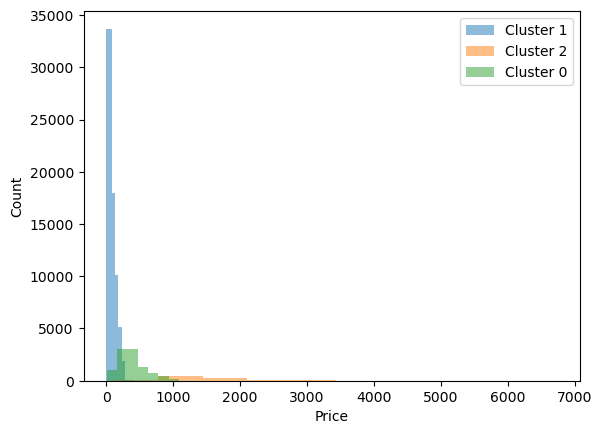

In [20]:
import matplotlib.pyplot as plt

cluster_labels = data["cluster_numerical"].unique()

for label in cluster_labels:
    cluster_data = data[data["cluster_numerical"] == label]
    plt.hist(cluster_data["price"], bins=10, alpha=0.5, label=f"Cluster {label}")

plt.xlabel("Price")
plt.ylabel("Count")
plt.legend()
plt.show()
